### Download COCO JSON file of Sunflower Dataset


In [1]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="QnI44klNXIJV1kK3wG1Y")
project = rf.workspace("sunflower-detection").project("final-1yr0d")
version = project.version(3)
dataset = version.download("coco")

loading Roboflow workspace...
loading Roboflow project...


### Install ultralytics supervision and Roboflow. Then check for the CUDA

In [2]:
!pip install ultralytics supervision roboflow
import ultralytics
ultralytics.checks()

Ultralytics 8.3.164  Python-3.13.3 torch-2.7.1+cu128 CUDA:0 (NVIDIA GeForce RTX 5060 Ti, 16311MiB)
Setup complete  (16 CPUs, 15.4 GB RAM, 153.5/165.0 GB disk)


In [3]:
!pip install pycocotools tqdm


In [4]:
import os
import shutil
import json
from pathlib import Path
import yaml
from ultralytics import YOLO

### Convert Train, Test, Val data from COCO to YOLO format

In [5]:
import json
import shutil
from pathlib import Path

# ----------------------------------------------------------------------------
# 0. Paths & COCO→YOLO conversion
# ----------------------------------------------------------------------------

# Update these paths based on your local system
COCO_ROOT     = Path("D:/EWU/10th Semester/CSE475/LABS/ASSIGNMENT/Final-3")  # folder containing train/ and valid/
TRAIN_IMG_DIR = COCO_ROOT / "train"
TRAIN_ANN     = TRAIN_IMG_DIR / "_annotations.coco.json"
VAL_IMG_DIR   = COCO_ROOT / "valid"
VAL_ANN       = VAL_IMG_DIR / "_annotations.coco.json"

WORK          = Path("D:/EWU/10th Semester/CSE475/LABS/ASSIGNMENT/Converted_Dataset")  # output directory (can rename)

# Create output directory structure
for split in ["train", "valid", "test"]:
    for sub in ["images", "labels"]:
        (WORK / split / sub).mkdir(parents=True, exist_ok=True)

# Function to convert COCO bbox to YOLO format
def coco2yolo(box, w, h):
    x, y, w_box, h_box = box
    return ((x + w_box/2) / w, (y + h_box/2) / h, w_box / w, h_box / h)

# Convert one split from COCO to YOLO format
def convert(split, img_dir, ann_file, out_dir):
    with open(ann_file, "r") as f:
        coco = json.load(f)

    id2img = {img["id"]: img for img in coco["images"]}
    imgs_o = out_dir / split / "images"
    labs_o = out_dir / split / "labels"

    for ann in coco["annotations"]:
        img = id2img[ann["image_id"]]
        yolo_box = coco2yolo(ann["bbox"], img["width"], img["height"])
        cls = ann["category_id"] - 1  # Class index starts from 0 in YOLO
        label_path = labs_o / f"{Path(img['file_name']).stem}.txt"
        with open(label_path, "a") as f:
            f.write(f"{cls} " + " ".join(f"{v:.6f}" for v in yolo_box) + "\n")

    for img in coco["images"]:
        shutil.copy(img_dir / img["file_name"], imgs_o / img["file_name"])

# ----------------------------------------------------------------------------
# 1. Perform Conversion
# ----------------------------------------------------------------------------
convert("train", TRAIN_IMG_DIR, TRAIN_ANN, WORK)
convert("valid", VAL_IMG_DIR,   VAL_ANN,   WORK)
convert("test",  TRAIN_IMG_DIR, TRAIN_ANN, WORK)  # Optional test reuse


### Visualize Some Annotated images

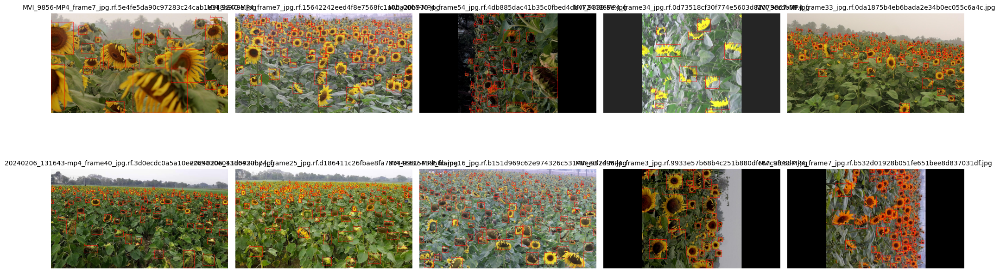

In [6]:
import cv2
import matplotlib.pyplot as plt
import random

# ----------------------------------------------------------------------------
# 2. Visualize Converted YOLO Annotations
# ----------------------------------------------------------------------------

def draw_yolo_bbox(img_path, label_path):
    image = cv2.imread(str(img_path))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    h, w, _ = image.shape

    if not label_path.exists():
        return image  # No label file

    with open(label_path, "r") as f:
        for line in f.readlines():
            cls, x_c, y_c, bw, bh = map(float, line.strip().split())
            x1 = int((x_c - bw / 2) * w)
            y1 = int((y_c - bh / 2) * h)
            x2 = int((x_c + bw / 2) * w)
            y2 = int((y_c + bh / 2) * h)
            cv2.rectangle(image, (x1, y1), (x2, y2), (255, 0, 0), 2)
            cv2.putText(image, str(int(cls)), (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)
    return image

# Pick 10 random images from the converted train split
img_dir = WORK / "train" / "images"
lbl_dir = WORK / "train" / "labels"
img_files = list(img_dir.glob("*.jpg"))
sample_files = random.sample(img_files, min(10, len(img_files)))

# Plot 2 rows of 5 images
plt.figure(figsize=(20, 8))
for idx, img_path in enumerate(sample_files):
    label_path = lbl_dir / f"{img_path.stem}.txt"
    img = draw_yolo_bbox(img_path, label_path)
    plt.subplot(2, 5, idx + 1)
    plt.imshow(img)
    plt.title(img_path.name, fontsize=10)
    plt.axis("off")
plt.tight_layout()
plt.show()


### Create the data_Sunflower.yaml file

In [7]:
# ----------------------------------------------------------------------------
# 1. Write data YAML
# ----------------------------------------------------------------------------
import yaml

cats  = json.load(open(TRAIN_ANN))["categories"]
names = [c["name"] for c in sorted(cats, key=lambda x: x["id"])]
data_cfg = {
    "path":  str(WORK),
    "train": "train/images",
    "val":   "valid/images",
    "test":  "test/images",
    "nc":    len(names),
    "names": names
}
(WORK/"data_Sunflower.yaml").write_text(yaml.dump(data_cfg))

182

# YOLO v11s

## 1. Train

In [8]:
# ----------------------------------------------------------------------------
# 2. Train YOLOv12
# ----------------------------------------------------------------------------

# Load a COCO-pretrained YOLO12n model
model = YOLO("yolo11s.pt")

# Train the model on the COCO8 example dataset for 100 epochs
#results = model.train(data="coco8.yaml", epochs=100, imgsz=640)
model.train(
    data    = str(WORK/"data_Sunflower.yaml"),
    epochs  = 50,
    imgsz   = 640,
    batch   = 12,
    val     = True,
    save_json=True,
    project = str(WORK),
    name    = "yolov11_train",
    device  = 0
)

New https://pypi.org/project/ultralytics/8.3.167 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.164  Python-3.13.3 torch-2.7.1+cu128 CUDA:0 (NVIDIA GeForce RTX 5060 Ti, 16311MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=12, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\data_Sunflower.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11s.pt, momentum=0.937, mosaic=1.0, multi_scal

train: Scanning D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\train\labels... 3956 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3956/3956 [00:14<00:00, 275.85it/s]

train: D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\train\images\20240116_122814-mp4_frame11_jpg.rf.1ea7c19d48caa82d325c3a4462f1c068.jpg: 3312 duplicate labels removed
train: D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\train\images\20240116_122814-mp4_frame11_jpg.rf.c86e4dd894ab11bf7e11283c99906b60.jpg: 3312 duplicate labels removed
train: D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\train\images\20240116_122814-mp4_frame11_jpg.rf.fd0e88d12a1e1da910dea6445d0c30a5.jpg: 1936 duplicate labels removed
train: D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\train\images\20240116_122814-mp4_frame12_jpg.rf.686568be0d53c2319e2eb1de7064d855.jpg: 876 duplicate labels removed
train: D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\train\images\20240116_122814-mp4_frame12_jpg.rf.6f3bbd7fce65e64b4887ae39e1bf5967.jpg: 1392 duplicate labels removed
train: D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\train\i

train: New cache created: D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\train\labels.cache
val: Fast image access  (ping: 0.10.1 ms, read: 21.79.1 MB/s, size: 373.4 KB)


val: Scanning D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\valid\labels... 165 images, 0 backgrounds, 0 corrupt: 100%|██████████| 165/165 [00:01<00:00, 93.88it/s] 

val: D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\valid\images\20240116_122814-mp4_frame20_jpg.rf.fe2fe601d15af2bbf6cea29b1a9fefe6.jpg: 2200 duplicate labels removed
val: D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\valid\images\20240116_122814-mp4_frame22_jpg.rf.968ed6ec116e0a9251190e4201b17dc5.jpg: 1881 duplicate labels removed
val: D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\valid\images\20240116_122814-mp4_frame24_jpg.rf.6b8247da45f8de277d492019c0b4dc17.jpg: 1980 duplicate labels removed
val: D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\valid\images\20240116_122814-mp4_frame25_jpg.rf.8c9c29859a4c704589a1256679819abb.jpg: 880 duplicate labels removed
val: D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\valid\images\20240116_122814-mp4_frame32_jpg.rf.b894b8e3be7c5306ed3ee82e9b3b07b0.jpg: 1023 duplicate labels removed
val: D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\valid\images\202401

Plotting labels to D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\yolov11_train\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.00046875), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\yolov11_train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50       7.4G      1.553      1.009      1.005       1241        640: 100%|██████████| 330/330 [01:03<00:00,  5.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.67it/s]

                   all        165      13823      0.817      0.759       0.84      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      7.43G      1.391     0.7274     0.9493       1122        640: 100%|██████████| 330/330 [00:56<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.60it/s]


                   all        165      13823      0.829      0.792      0.864      0.498

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      7.43G      1.362     0.7069     0.9405        831        640: 100%|██████████| 330/330 [00:55<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.12it/s]


                   all        165      13823       0.84      0.799      0.879      0.535

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50       8.3G       1.35       0.69     0.9367       1101        640: 100%|██████████| 330/330 [00:55<00:00,  5.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.77it/s]


                   all        165      13823      0.838      0.789      0.875      0.525

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      7.51G      1.322     0.6791     0.9321       1552        640: 100%|██████████| 330/330 [00:55<00:00,  5.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.80it/s]


                   all        165      13823      0.835        0.8      0.876      0.514

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      8.29G      1.307     0.6635     0.9261        929        640: 100%|██████████| 330/330 [00:55<00:00,  5.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.60it/s]

                   all        165      13823      0.845      0.798      0.881      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      8.51G      1.291     0.6579     0.9248       1176        640: 100%|██████████| 330/330 [00:55<00:00,  5.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.85it/s]


                   all        165      13823      0.849      0.808      0.891      0.556

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      7.16G       1.28     0.6458     0.9192       1027        640: 100%|██████████| 330/330 [00:56<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.65it/s]


                   all        165      13823      0.846      0.798      0.885      0.536

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      7.16G       1.27      0.642     0.9185       1116        640: 100%|██████████| 330/330 [00:55<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.66it/s]


                   all        165      13823      0.846      0.807      0.891      0.545

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      9.48G      1.255     0.6317     0.9151        815        640: 100%|██████████| 330/330 [00:55<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.61it/s]

                   all        165      13823       0.85      0.806      0.891      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      7.47G      1.257     0.6308     0.9171        840        640: 100%|██████████| 330/330 [00:55<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.71it/s]


                   all        165      13823      0.844      0.806      0.889      0.551

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      7.47G      1.243       0.62     0.9114       1058        640: 100%|██████████| 330/330 [00:55<00:00,  5.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.78it/s]


                   all        165      13823      0.839      0.804      0.886      0.546

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      7.47G      1.238     0.6163     0.9111       1180        640: 100%|██████████| 330/330 [00:55<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.80it/s]


                   all        165      13823      0.858      0.809      0.895      0.561

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      7.47G      1.228     0.6107       0.91        946        640: 100%|██████████| 330/330 [00:55<00:00,  5.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.63it/s]


                   all        165      13823      0.841      0.817      0.893      0.563

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      7.47G      1.221     0.6103     0.9069        598        640: 100%|██████████| 330/330 [00:55<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.20it/s]

                   all        165      13823      0.856      0.816      0.901      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      7.47G      1.224     0.6081     0.9093        636        640: 100%|██████████| 330/330 [00:55<00:00,  5.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.87it/s]


                   all        165      13823      0.854      0.817      0.899      0.565

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      7.47G      1.211        0.6      0.905        983        640: 100%|██████████| 330/330 [00:55<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.22it/s]


                   all        165      13823       0.85      0.814      0.895      0.568

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      7.49G      1.198     0.5924     0.9036        890        640: 100%|██████████| 330/330 [00:55<00:00,  5.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.84it/s]


                   all        165      13823      0.857      0.817        0.9      0.576

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      7.51G      1.196     0.5909     0.9036       1198        640: 100%|██████████| 330/330 [00:55<00:00,  5.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.24it/s]


                   all        165      13823      0.848      0.823      0.901      0.569

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      7.51G      1.194     0.5877     0.9019       1300        640: 100%|██████████| 330/330 [00:55<00:00,  6.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.84it/s]


                   all        165      13823      0.853      0.817      0.899      0.574

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      7.53G      1.189     0.5861     0.8999        908        640: 100%|██████████| 330/330 [00:56<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.22it/s]


                   all        165      13823      0.855      0.824      0.902      0.578

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      7.53G      1.187     0.5849     0.8997       1135        640: 100%|██████████| 330/330 [00:55<00:00,  5.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.84it/s]


                   all        165      13823      0.846      0.827      0.901       0.58

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      8.35G      1.183     0.5805     0.8988       1017        640: 100%|██████████| 330/330 [00:55<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.56it/s]


                   all        165      13823      0.859      0.813      0.902      0.573

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      7.91G      1.174     0.5753     0.8959        669        640: 100%|██████████| 330/330 [00:56<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.86it/s]


                   all        165      13823      0.859      0.816      0.902      0.575

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      7.91G      1.168     0.5745     0.8967        897        640: 100%|██████████| 330/330 [00:55<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.71it/s]


                   all        165      13823      0.859      0.822      0.904      0.576

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      9.39G      1.163     0.5701     0.8944       1289        640: 100%|██████████| 330/330 [00:55<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.85it/s]


                   all        165      13823       0.86      0.822      0.906      0.578

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      7.77G      1.159      0.566     0.8923       1040        640: 100%|██████████| 330/330 [00:55<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.84it/s]


                   all        165      13823       0.86      0.818      0.903       0.58

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      8.52G      1.156     0.5638     0.8941        722        640: 100%|██████████| 330/330 [00:55<00:00,  5.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.84it/s]


                   all        165      13823      0.856      0.818      0.903      0.582

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      6.33G      1.151     0.5606     0.8916        872        640: 100%|██████████| 330/330 [00:55<00:00,  5.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.85it/s]


                   all        165      13823      0.855      0.821      0.902      0.579

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      7.06G      1.144     0.5586     0.8904        582        640: 100%|██████████| 330/330 [00:55<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.84it/s]


                   all        165      13823      0.859      0.819      0.903      0.581

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      7.81G      1.139     0.5563     0.8887       1019        640: 100%|██████████| 330/330 [00:55<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.61it/s]

                   all        165      13823      0.858      0.826      0.908      0.584



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      8.57G       1.13     0.5513      0.888        551        640: 100%|██████████| 330/330 [00:55<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.87it/s]


                   all        165      13823      0.855      0.825      0.904      0.583

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      6.21G      1.129     0.5495     0.8876        740        640: 100%|██████████| 330/330 [00:55<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.78it/s]


                   all        165      13823      0.856      0.823      0.904      0.583

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      7.87G      1.123     0.5459     0.8873       1821        640: 100%|██████████| 330/330 [00:55<00:00,  5.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.88it/s]


                   all        165      13823       0.85      0.825      0.903      0.583

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      7.87G      1.124     0.5439     0.8853       1156        640: 100%|██████████| 330/330 [00:55<00:00,  5.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.67it/s]

                   all        165      13823      0.854      0.827      0.906      0.585



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      7.87G      1.121     0.5432     0.8844        736        640: 100%|██████████| 330/330 [00:55<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.87it/s]

                   all        165      13823      0.865      0.821      0.908      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      7.87G      1.111     0.5378     0.8856       1430        640: 100%|██████████| 330/330 [00:55<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.83it/s]


                   all        165      13823      0.855      0.826      0.905       0.59

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      7.87G      1.111     0.5372      0.884        961        640: 100%|██████████| 330/330 [00:55<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.18it/s]


                   all        165      13823      0.858      0.829      0.908       0.59

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      7.87G      1.104     0.5345     0.8819        906        640: 100%|██████████| 330/330 [00:55<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.87it/s]

                   all        165      13823      0.855      0.831      0.908      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      7.87G      1.101     0.5325     0.8815        880        640: 100%|██████████| 330/330 [00:55<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.19it/s]


                   all        165      13823      0.856      0.823      0.905      0.583
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      7.87G      1.094     0.5263     0.8831        543        640: 100%|██████████| 330/330 [00:51<00:00,  6.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.29it/s]

                   all        165      13823      0.859      0.825      0.907      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      7.87G      1.083     0.5209     0.8799        415        640: 100%|██████████| 330/330 [00:50<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.95it/s]

                   all        165      13823      0.858      0.826      0.908       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      7.87G      1.076     0.5149     0.8768        698        640: 100%|██████████| 330/330 [00:50<00:00,  6.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.23it/s]

                   all        165      13823      0.863      0.828      0.908      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      7.87G      1.069     0.5116     0.8775        381        640: 100%|██████████| 330/330 [00:50<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.93it/s]


                   all        165      13823      0.857      0.829      0.907      0.593

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      7.87G      1.063      0.508     0.8756        561        640: 100%|██████████| 330/330 [00:50<00:00,  6.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.19it/s]

                   all        165      13823      0.859      0.825      0.907       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      7.87G      1.056     0.5042     0.8743        642        640: 100%|██████████| 330/330 [00:50<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.95it/s]


                   all        165      13823      0.855      0.831      0.908      0.594

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      7.87G      1.051     0.5008     0.8707        396        640: 100%|██████████| 330/330 [00:50<00:00,  6.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.93it/s]


                   all        165      13823      0.858      0.831      0.908      0.594

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      7.87G      1.043      0.497     0.8713        315        640: 100%|██████████| 330/330 [00:50<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.95it/s]

                   all        165      13823       0.86      0.831      0.909      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      7.87G      1.037     0.4929     0.8698        619        640: 100%|██████████| 330/330 [00:50<00:00,  6.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.45it/s]

                   all        165      13823      0.858      0.833      0.908      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      7.87G      1.032     0.4894      0.868        522        640: 100%|██████████| 330/330 [00:51<00:00,  6.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.87it/s]


                   all        165      13823       0.86      0.832      0.909      0.596

50 epochs completed in 0.797 hours.
Optimizer stripped from D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\yolov11_train\weights\last.pt, 19.2MB
Optimizer stripped from D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\yolov11_train\weights\best.pt, 19.2MB

Validating D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\yolov11_train\weights\best.pt...
Ultralytics 8.3.164  Python-3.13.3 torch-2.7.1+cu128 CUDA:0 (NVIDIA GeForce RTX 5060 Ti, 16311MiB)
YOLO11s summary (fused): 100 layers, 9,413,961 parameters, 0 gradients, 21.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:08<00:00,  1.17s/it]


                   all        165      13823      0.858      0.833      0.908      0.597
    Backside-Sunflower        165      13823      0.858      0.833      0.908      0.597
Speed: 0.2ms preprocess, 2.1ms inference, 0.0ms loss, 1.4ms postprocess per image
Saving D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\yolov11_train\predictions.json...
Results saved to D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\yolov11_train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001DF0CBF5A90>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.0480

Visualization of the Loss Curve

Available columns: ['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss', 'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss', 'lr/pg0', 'lr/pg1', 'lr/pg2']


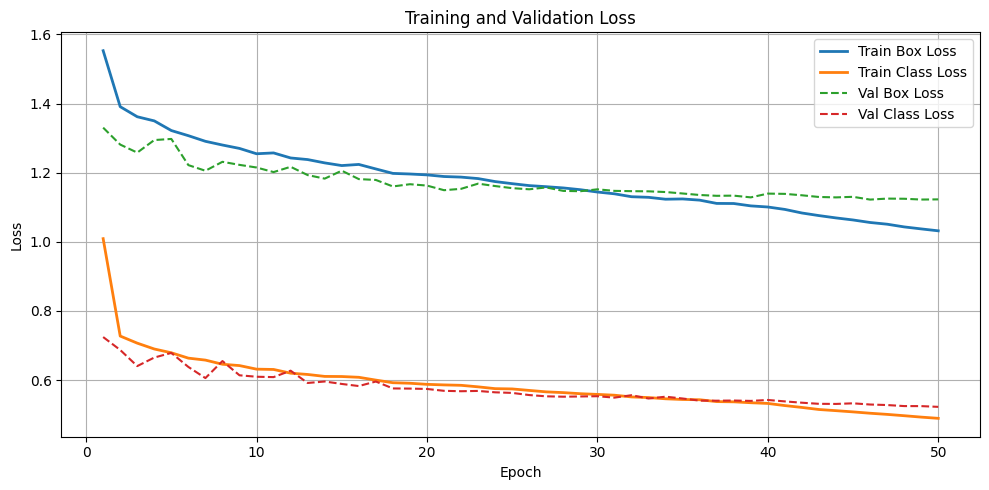

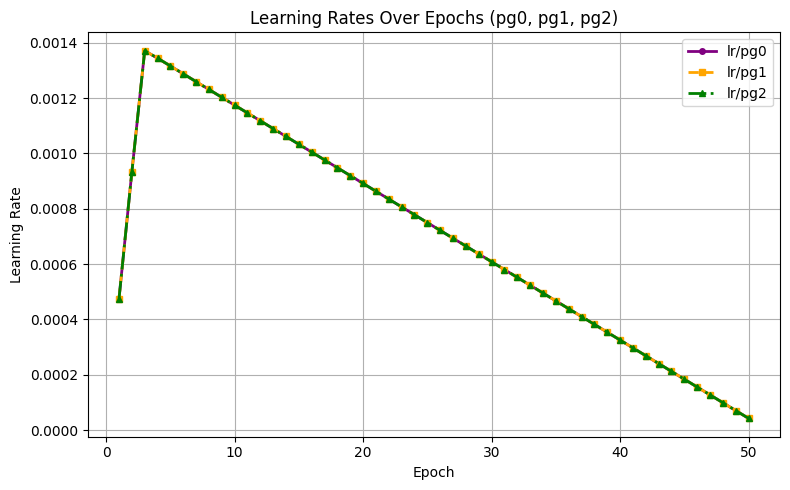

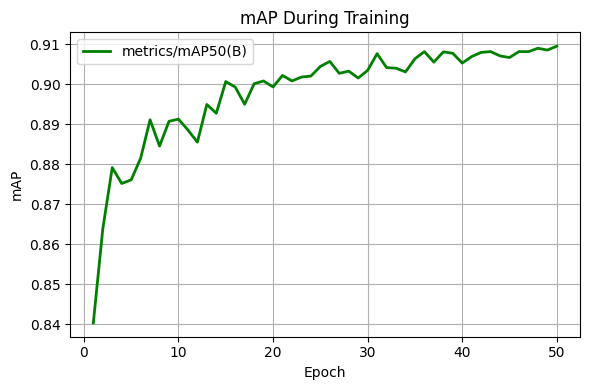

In [8]:
# ----------------------------------------------------------------------------
# 3. Visualize Training Metrics
# ----------------------------------------------------------------------------
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path

# Path to results.csv
results_path = WORK / "yolov11_train" / "results.csv"

# Load CSV
df = pd.read_csv(results_path)

# Show available columns
print("Available columns:", df.columns.tolist())

# Plot Loss Curves
plt.figure(figsize=(10, 5))
plt.plot(df["epoch"], df["train/box_loss"], label="Train Box Loss", linewidth=2)
plt.plot(df["epoch"], df["train/cls_loss"], label="Train Class Loss", linewidth=2)
plt.plot(df["epoch"], df["val/box_loss"], label="Val Box Loss", linestyle="--")
plt.plot(df["epoch"], df["val/cls_loss"], label="Val Class Loss", linestyle="--")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

lr_columns = [col for col in df.columns if col.startswith("lr/pg")]
colors = ['purple', 'orange', 'green']
styles = ['-', '--', '-.']
markers = ['o', 's', '^']

if lr_columns:
    plt.figure(figsize=(8, 5))
    for idx, col in enumerate(lr_columns):
        plt.plot(
            df["epoch"], df[col],
            label=col,
            color=colors[idx % len(colors)],
            linestyle=styles[idx % len(styles)],
            marker=markers[idx % len(markers)],
            markersize=4,
            linewidth=2
        )
    plt.xlabel("Epoch")
    plt.ylabel("Learning Rate")
    plt.title("Learning Rates Over Epochs (pg0, pg1, pg2)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
else:
    print("No learning rate columns found.")


# Plot mAP Curve (0.5 IoU)
map_keys = ["metrics/mAP50(B)", "metrics/mAP50-95(B)"]  # version dependent
map_column = next((key for key in map_keys if key in df.columns), None)

if map_column:
    plt.figure(figsize=(6, 4))
    plt.plot(df["epoch"], df[map_column], label=map_column, color="green", linewidth=2)
    plt.xlabel("Epoch")
    plt.ylabel("mAP")
    plt.title("mAP During Training")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()
else:
    print("mAP column not found. Skipping mAP plot.")


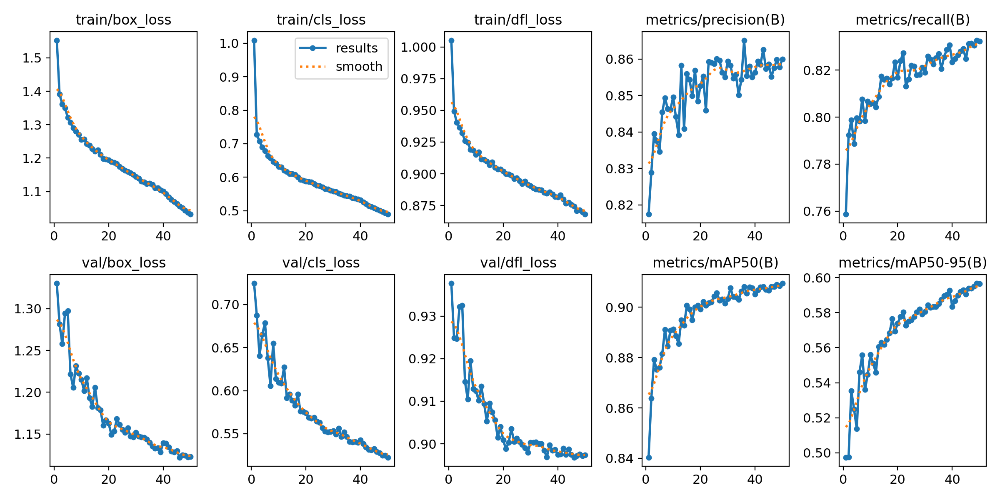

In [10]:
from PIL import Image
from IPython.display import display

results_img = WORK / "yolov11_train" / "results.png"
img = Image.open(results_img)
display(img)


## 2. VALIDATION

In [11]:
# ----------------------------------------------------------------------------
# 4. Validation Performance
# ----------------------------------------------------------------------------
val_results = model.val(
    data    = str(WORK/"data_Sunflower.yaml"),
    imgsz   = 640,
    batch   = 16
)
print("Validation metrics:", val_results)

Ultralytics 8.3.164  Python-3.13.3 torch-2.7.1+cu128 CUDA:0 (NVIDIA GeForce RTX 5060 Ti, 16311MiB)
YOLO11s summary (fused): 100 layers, 9,413,961 parameters, 0 gradients, 21.3 GFLOPs
val: Fast image access  (ping: 0.00.0 ms, read: 2408.8341.0 MB/s, size: 362.3 KB)


val: Scanning D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\valid\labels.cache... 165 images, 0 backgrounds, 0 corrupt: 100%|██████████| 165/165 [00:00<?, ?it/s]

val: D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\valid\images\20240116_122814-mp4_frame20_jpg.rf.fe2fe601d15af2bbf6cea29b1a9fefe6.jpg: 2200 duplicate labels removed
val: D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\valid\images\20240116_122814-mp4_frame22_jpg.rf.968ed6ec116e0a9251190e4201b17dc5.jpg: 1881 duplicate labels removed
val: D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\valid\images\20240116_122814-mp4_frame24_jpg.rf.6b8247da45f8de277d492019c0b4dc17.jpg: 1980 duplicate labels removed
val: D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\valid\images\20240116_122814-mp4_frame25_jpg.rf.8c9c29859a4c704589a1256679819abb.jpg: 880 duplicate labels removed
val: D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\valid\images\20240116_122814-mp4_frame32_jpg.rf.b894b8e3be7c5306ed3ee82e9b3b07b0.jpg: 1023 duplicate labels removed
val: D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\valid\images\202401


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.12it/s]


                   all        165      13823      0.858      0.833      0.909      0.599
    Backside-Sunflower        165      13823      0.858      0.833      0.909      0.599
Speed: 0.9ms preprocess, 21.8ms inference, 0.0ms loss, 26.6ms postprocess per image
Saving D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\yolov11_train2\predictions.json...
Results saved to D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\yolov11_train2
Validation metrics: ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001DF37449240>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012

## 3. TEST


In [12]:
# ----------------------------------------------------------------------------
# 5. Test Performance
# ----------------------------------------------------------------------------
test_results = model.val(
    data    = str(WORK/"data_Sunflower.yaml"),
    imgsz   = 640,
    batch   = 16,
    split   = "test"
)
print("Test metrics:", test_results)

Ultralytics 8.3.164  Python-3.13.3 torch-2.7.1+cu128 CUDA:0 (NVIDIA GeForce RTX 5060 Ti, 16311MiB)
val: Fast image access  (ping: 0.20.0 ms, read: 49.521.8 MB/s, size: 318.2 KB)


val: Scanning D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\test\labels... 3956 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3956/3956 [00:14<00:00, 271.97it/s]

val: D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\test\images\20240116_122814-mp4_frame11_jpg.rf.1ea7c19d48caa82d325c3a4462f1c068.jpg: 3036 duplicate labels removed
val: D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\test\images\20240116_122814-mp4_frame11_jpg.rf.c86e4dd894ab11bf7e11283c99906b60.jpg: 3036 duplicate labels removed
val: D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\test\images\20240116_122814-mp4_frame11_jpg.rf.fd0e88d12a1e1da910dea6445d0c30a5.jpg: 1936 duplicate labels removed
val: D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\test\images\20240116_122814-mp4_frame12_jpg.rf.686568be0d53c2319e2eb1de7064d855.jpg: 803 duplicate labels removed
val: D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\test\images\20240116_122814-mp4_frame12_jpg.rf.6f3bbd7fce65e64b4887ae39e1bf5967.jpg: 1276 duplicate labels removed
val: D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\test\images\20240116_122

val: New cache created: D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\test\labels.cache


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   1%|          | 2/248 [00:02<04:20,  1.06s/it]

WARNING NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 248/248 [00:48<00:00,  5.14it/s]


                   all       3956     268893       0.71      0.735      0.799       0.51
             Sunflower          6         90      0.461      0.767      0.679      0.395
    Backside-Sunflower       3956     268803      0.958      0.704       0.92      0.625
Speed: 0.2ms preprocess, 2.7ms inference, 0.0ms loss, 2.0ms postprocess per image
Saving D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\yolov11_train3\predictions.json...
Results saved to D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\yolov11_train3
Test metrics: ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001DF57E903D0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.

## 4. Classification Report and Confusion Matrix


image 1/3956 D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\test\images\20240116_122814-mp4_frame11_jpg.rf.1ea7c19d48caa82d325c3a4462f1c068.jpg: 384x640 159 Backside-Sunflowers, 43.6ms
image 2/3956 D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\test\images\20240116_122814-mp4_frame11_jpg.rf.c86e4dd894ab11bf7e11283c99906b60.jpg: 384x640 155 Backside-Sunflowers, 36.1ms
image 3/3956 D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\test\images\20240116_122814-mp4_frame11_jpg.rf.fd0e88d12a1e1da910dea6445d0c30a5.jpg: 384x640 79 Backside-Sunflowers, 9.8ms
image 4/3956 D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\test\images\20240116_122814-mp4_frame12_jpg.rf.686568be0d53c2319e2eb1de7064d855.jpg: 384x640 93 Backside-Sunflowers, 9.5ms
image 5/3956 D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\test\images\20240116_122814-mp4_frame12_jpg.rf.6f3bbd7fce65e64b4887ae39e1bf5967.jpg: 384x640 151 Backside-Sunflowers, 9.6ms
imag

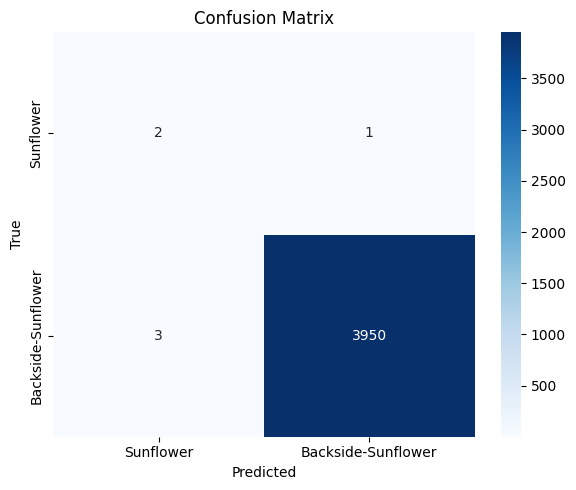

In [13]:
# ----------------------------------------------------------------------------
# 6. Generate Classification Report & Confusion Matrix
# ----------------------------------------------------------------------------

from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path
import numpy as np

# Run predictions on test images (stream=True saves memory)
preds = model.predict(
    source=str(WORK / "test" / "images"),
    imgsz=640,
    stream=True
)

# Get class names from the model
CLASS_NAMES = list(model.names.values())
NUM_CLASSES = len(CLASS_NAMES)

# Fix: initialize y_true and y_pred correctly
y_true = []
y_pred = []

for pred in preds:
    # Predicted class (use highest confidence box only)
    if pred.boxes is not None and len(pred.boxes.cls) > 0:
        pred_class = int(pred.boxes.cls[0].item())
        y_pred.append(pred_class)
    else:
        y_pred.append(-1)  # No prediction

    # True class from YOLO-style label file
    image_name = Path(pred.path).stem
    label_file = WORK / "test" / "labels" / f"{image_name}.txt"

    if label_file.exists():
        with open(label_file, 'r') as f:
            line = f.readline().strip()
            if line:
                true_label = int(line.split()[0])
                y_true.append(true_label)
            else:
                y_true.append(-1)  # Empty label file
    else:
        y_true.append(-1)  # Label file not found

# Remove predictions with missing true/predicted labels
filtered_true = [t for t, p in zip(y_true, y_pred) if t != -1 and p != -1]
filtered_pred = [p for t, p in zip(y_true, y_pred) if t != -1 and p != -1]

# Prepare classification report
print("\nClassification Report:")
used_labels = sorted(set(filtered_true + filtered_pred))
used_names = [CLASS_NAMES[i] for i in used_labels]

print(classification_report(
    filtered_true,
    filtered_pred,
    labels=used_labels,
    target_names=used_names,
    zero_division=0  # Prevents division by zero warning
))

# Confusion matrix
cm = confusion_matrix(filtered_true, filtered_pred, labels=used_labels)

# Plot confusion matrix
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=used_names, yticklabels=used_names)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.tight_layout()
plt.show()


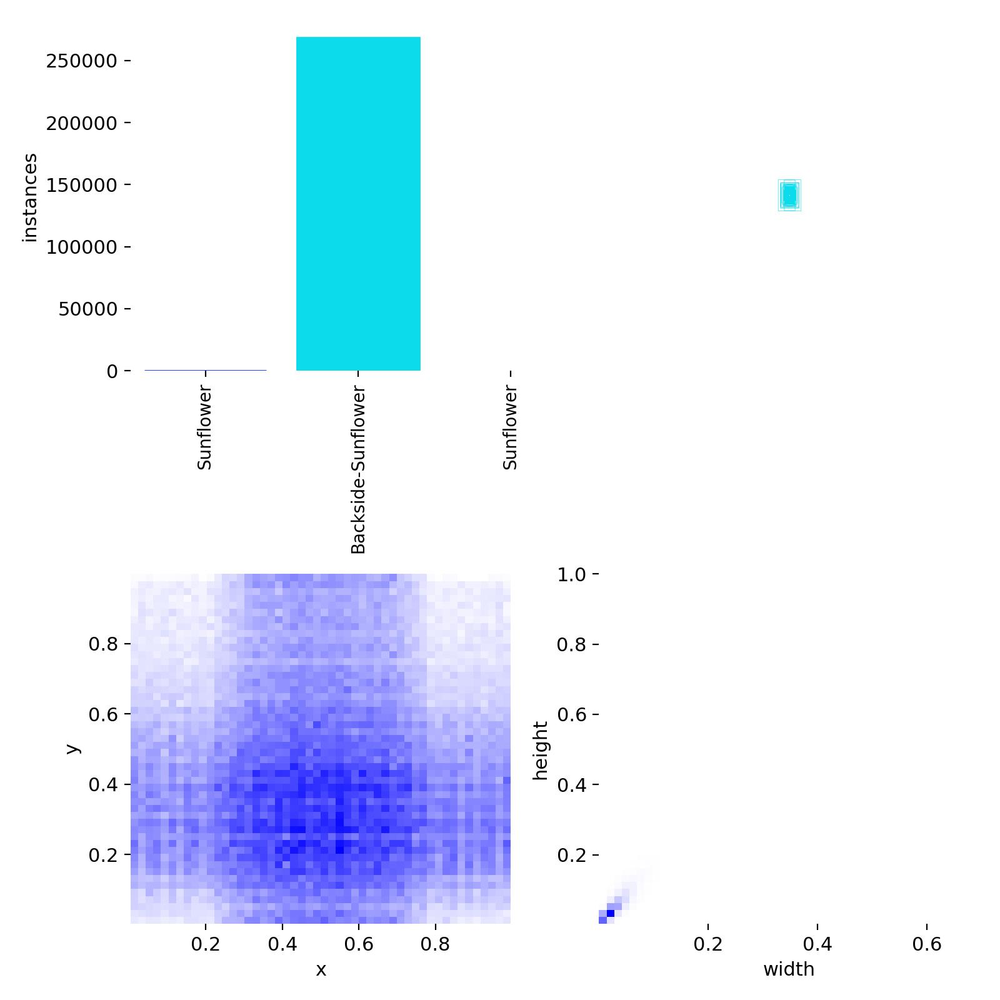

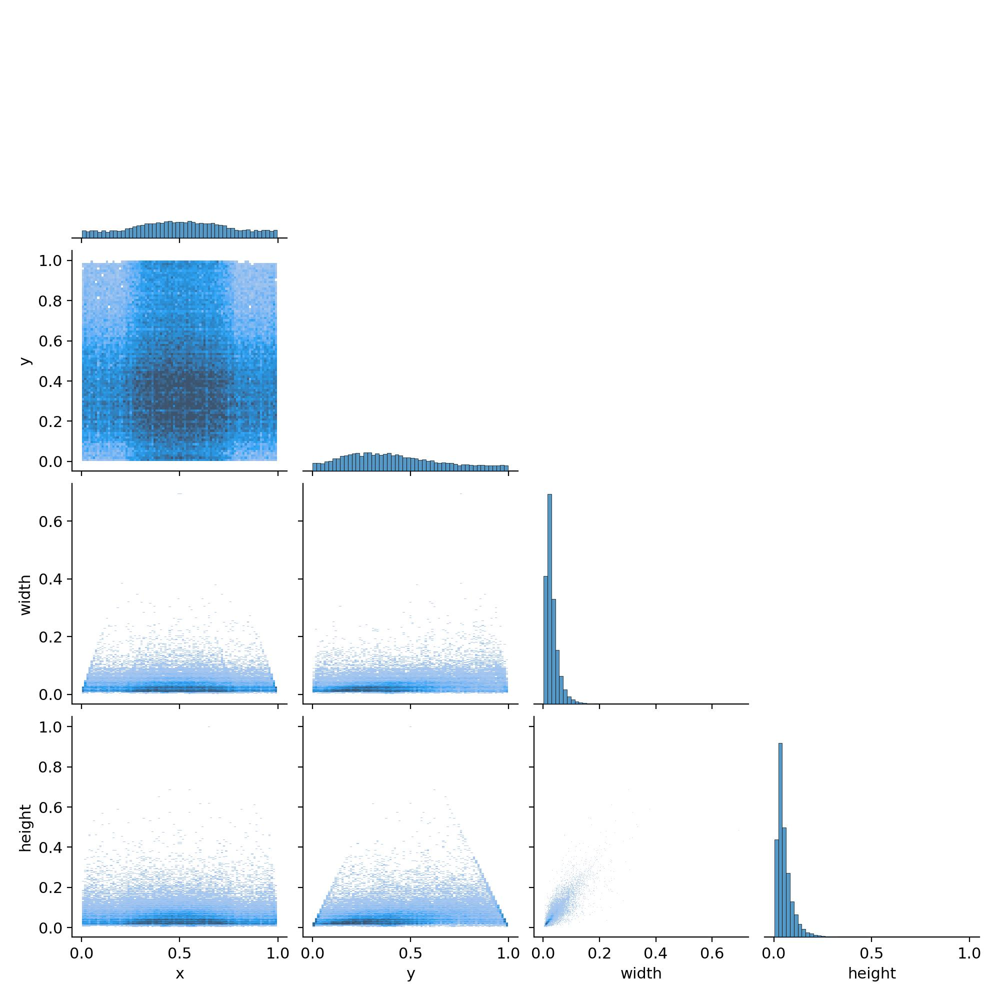

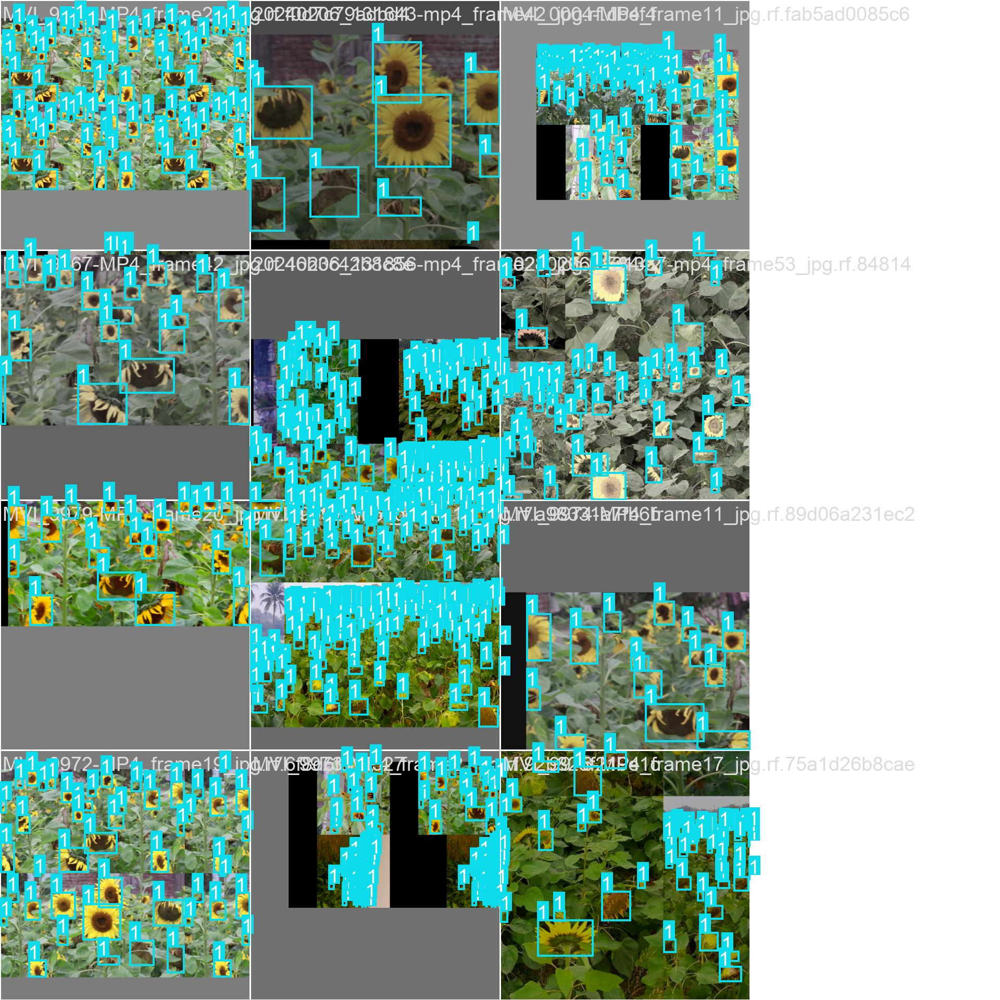

In [14]:
import glob
import os
from IPython.display import Image as IPyImage, display

latest_folder = max(glob.glob(str(WORK / "yolov11_train")), key=os.path.getmtime)
for img in glob.glob(f'{latest_folder}/*.jpg')[:3]:
	display(IPyImage(filename=img, width=600))
	print("\n")

## 5. Save the best Weights

In [15]:
latest_folder = str(WORK / "yolov11_train")

from pathlib import Path
import glob
import os

# Assuming WORK is a Path object
WORK = Path(WORK)

# Full path to the parent folder
parent_folder = WORK / "yolov11_train"

# Get the most recent folder inside 'yolov11_train'
latest_folder = max(
    [f for f in parent_folder.iterdir() if f.is_dir()],
    key=lambda x: x.stat().st_mtime
)

print(f"Latest folder: {latest_folder}")

# Now, get images inside the latest_folder
for img_path in latest_folder.glob("*.jpg"):
    print(img_path)

Latest folder: D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\yolov11_train\weights


In [16]:
# ----------------------------------------------------------------------------
# 7. Save Best Weights
# ----------------------------------------------------------------------------
best_weights = WORK/"yolov11_train"/"weights"/"best.pt"
print(f"Best model saved to {best_weights}")

Best model saved to D:\EWU\10th Semester\CSE475\LABS\ASSIGNMENT\Converted_Dataset\yolov11_train\weights\best.pt


## 6. XAI

In [4]:
!git clone https://github.com/rigvedrs/YOLO-V11-CAM.git




fatal: destination path 'YOLO-V11-CAM' already exists and is not an empty directory.


In [5]:
!ls

'ls' is not recognized as an internal or external command,
operable program or batch file.


In [6]:
import sys
sys.path.append("D:/EWU/10th Semester/CSE475/YOLO-V11-CAM")
from yolo_cam.eigen_cam import EigenCAM
from yolo_cam.utils.image import show_cam_on_image, scale_cam_image

In [7]:
model = YOLO('D:/EWU/10th Semester/CSE475/LABS/ASSIGNMENT/Converted_Dataset/yolov11_train/weights/best.pt')
model = model.cpu()

In [9]:
import cv2
import numpy as np
img = cv2.imread('D:/EWU/10th Semester/CSE475/LABS/ASSIGNMENT/Converted_Dataset/test/images/MVI_9999-MP4_frame4_jpg.rf.1f986c864224c5c6d14b9fd6948862d9.jpg')
img = cv2.resize(img, (640, 640))
rgb_img = img.copy()
img = np.float32(img) / 255

In [10]:
target_layers =[model.model.model[-2]]


0: 640x640 17 Backside-Sunflowers, 362.3ms
Speed: 4.2ms preprocess, 362.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


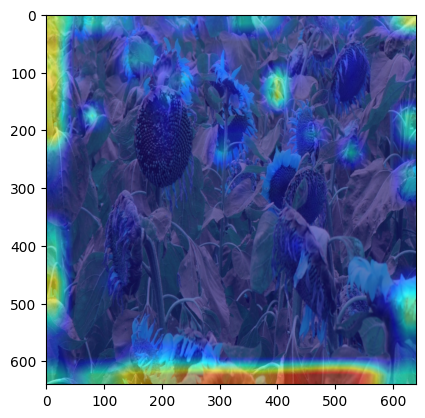

In [12]:
import matplotlib.pyplot as plt
cam = EigenCAM(model, target_layers,task='od')
grayscale_cam = cam(rgb_img)[0, :, :]
cam_image = show_cam_on_image(img, grayscale_cam, use_rgb=True)
plt.imshow(cam_image)
plt.show()

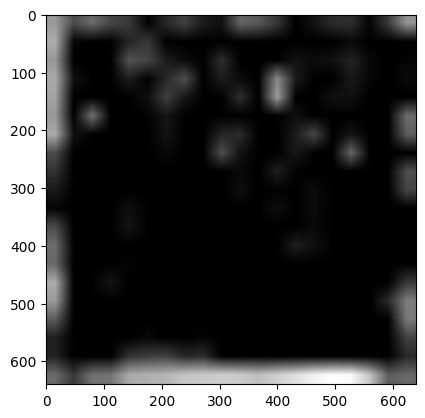

In [13]:
import matplotlib.pyplot as plt
g_scale = np.stack([grayscale_cam] * 3, axis=2)
plt.imshow(g_scale)

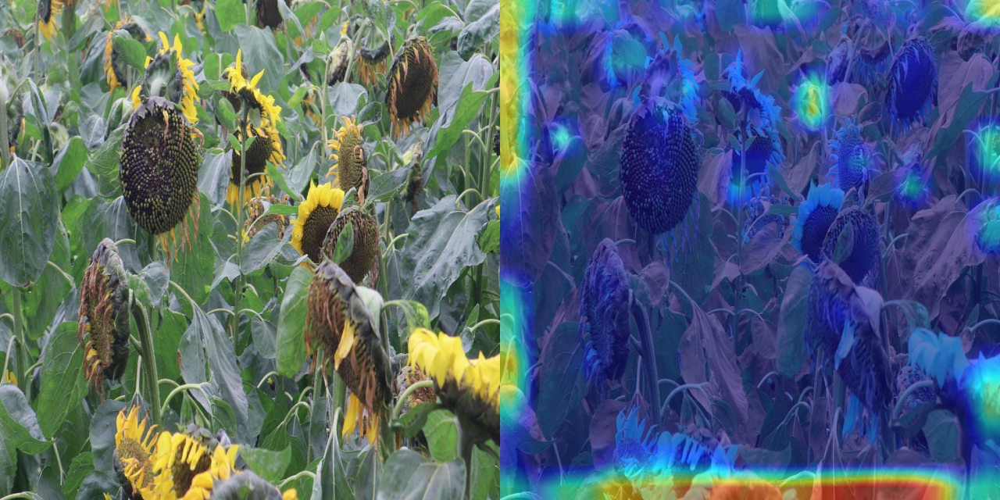

In [15]:
import cv2
from PIL import Image
im = cv2.cvtColor(rgb_img, cv2.COLOR_RGB2BGR)
Image.fromarray(np.hstack((im, cam_image)))

Model has 24 layers.
Using target layers at indices: [21, 22, 23]

0: 640x640 (no detections), 341.2ms
Speed: 5.9ms preprocess, 341.2ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


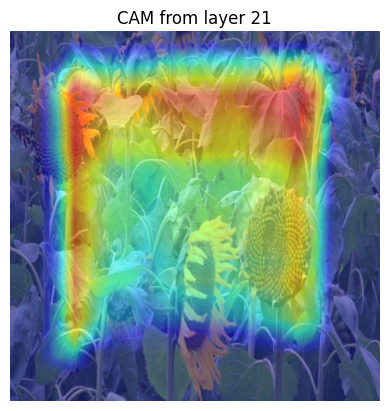


0: 640x640 (no detections), 330.2ms
Speed: 7.3ms preprocess, 330.2ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


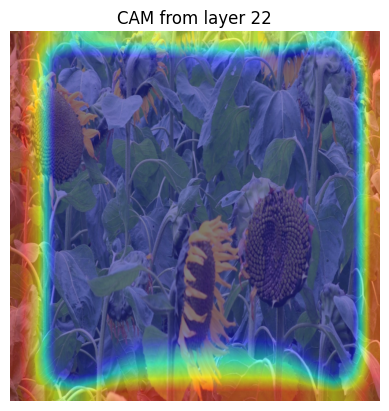


0: 640x640 (no detections), 395.6ms
Speed: 7.0ms preprocess, 395.6ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


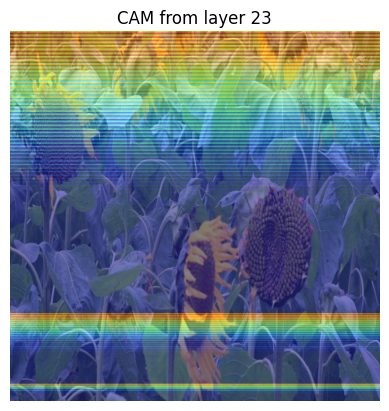


0: 640x640 2 Backside-Sunflowers, 395.0ms
Speed: 12.9ms preprocess, 395.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


In [16]:
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from ultralytics import YOLO
from yolo_cam.eigen_cam import EigenCAM
from yolo_cam.utils.image import show_cam_on_image

def doMultiScaleCAM(modelPath, imagePath, modelIndexes=None):
    model = YOLO(modelPath)
    model = model.cpu()

    img = cv2.imread(imagePath)
    if img is None:
        raise FileNotFoundError(f"Image not found: {imagePath}")

    img = cv2.resize(img, (640, 640))

    # Convert BGR to RGB for CAM input
    rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_norm = np.float32(rgb_img) / 255.0

    total_layers = len(model.model.model)
    print(f"Model has {total_layers} layers.")

    # If no indexes provided, pick last 3 layers (safe for most models)
    if modelIndexes is None:
        modelIndexes = [total_layers - 3, total_layers - 2, total_layers - 1]
    else:
        # Filter out-of-range indexes
        modelIndexes = [i for i in modelIndexes if 0 <= i < total_layers]

    print(f"Using target layers at indices: {modelIndexes}")

    # Define reshape_transform to handle tuple outputs
    def reshape_transform(tensor_or_tuple):
        if isinstance(tensor_or_tuple, tuple):
            return tensor_or_tuple[0]
        return tensor_or_tuple

    for i in modelIndexes:
        target_layers = [model.model.model[i]]
        cam = EigenCAM(model, target_layers, task='od', reshape_transform=reshape_transform)
        grayscale_cam = cam(img_norm)[0, :, :]
        cam_image = show_cam_on_image(img_norm, grayscale_cam, use_rgb=True)
        plt.imshow(cam_image)
        plt.axis('off')
        plt.title(f'CAM from layer {i}')
        plt.show()

    # Run detection and plot results
    results = model(rgb_img)[0]
    res_img = cv2.cvtColor(results.plot(), cv2.COLOR_BGR2RGB)

    # Combine original and result images horizontally
    combined = np.hstack((rgb_img, res_img))

    return Image.fromarray(combined)


# Usage example
result_img = doMultiScaleCAM(
    str("D:/EWU/10th Semester/CSE475/LABS/ASSIGNMENT/Converted_Dataset/yolov11_train/weights/best.pt"),
    r"D:/EWU/10th Semester/CSE475/LABS/ASSIGNMENT/Converted_Dataset/test/images/MVI_9999-MP4_frame17_jpg.rf.e91657359d2a27dfedeaacd487daa6e4.jpg"
)
result_img.show()
